# Audio Features Exploration

In this notebook we will:

1. **Load** per-frame audio features for each recording.  
2. **Aggregate** features over annotated “sound” segments and inter‑segment “silence” gaps.  
3. **Reduce dimensionality** (variance selection and PCA).  
4. **Cluster** regions (k‑means) and evaluate cluster quality.  
5. **Visualize** results via t‑SNE.

---

## 1. Imports & Configuration

- Load core libraries: `numpy`, `pandas`, `matplotlib`.  
- Bring in sklearn modules for PCA, clustering, and manifold learning.  
- Define paths and parameters:
  - `FEATURE_DIR`: directory of per-file `.npz` feature dumps.  
  - `ANNOTATION_CSV`: CSV of free‑text annotations with onsets/offsets.  
  - `FRAME_RATE`: frames per second of feature matrices (100 fps).


In [25]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random

from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE

# ─── Adjust these to your project structure ────────────────────────
BASE_DIR        = 'C:\\Users\\mueid\\development\\AI\\MLPC2025S_Data_Exploration\\MLPC2025_dataset'        # your dataset root
FEATURE_DIR     = os.path.join(BASE_DIR, 'audio_features')
ANNOTATION_CSV  = os.path.join(BASE_DIR, 'annotations.csv')
FRAME_RATE      = 100                          # frames-per-second of features
# ───────────────────────────────────────────────────────────────────

# Quick sanity check that we’re pointing at the right place:
print("Feature files:", len(os.listdir(FEATURE_DIR)), "files")
print("First few:", os.listdir(FEATURE_DIR)[:5])
print("Annotations CSV exists?", os.path.exists(ANNOTATION_CSV))


Feature files: 9026 files
First few: ['100300.npz', '100389.npz', '100489.npz', '100491.npz', '100492.npz']
Annotations CSV exists? True


## 2. Inspect Available Feature Files

- Count how many `.npz` files we have (should match number of unique recordings).  
- Peek at the first few filenames to confirm naming convention.  
- Load one sample file to see which feature arrays are stored (e.g. 'embeddings', 'mfcc', etc.) and their shapes.  


In [5]:
# ─── Cell 2: Load and inspect annotations ───────────────────────────
ann = pd.read_csv(ANNOTATION_CSV)
print("Total annotations:", len(ann))
print("Columns:", ann.columns.tolist())
ann.head()


Total annotations: 35826
Columns: ['task_id', 'filename', 'annotator', 'text', 'onset', 'offset', 'filename_unsafe']


,task_id,filename,annotator,text,onset,offset,filename_unsafe
0,161977861,560761.mp3,5945971035380930099053858595454362549806990533...,bird twitters nearby with a high pitch two times,16.552368,17.271435,560761_tufted titmouse calling.mp3
1,161987165,240538.mp3,4916274343929406460752597829190197300566135449...,A cow bell clinging repeatedly,12.265866,15.420303,240538_AMB - Cowbell stable Stereowav.mp3
2,161989998,660337.mp3,8960534646813062318784592632173589349806817458...,A child speaks with a high-pitched voice,12.493984,13.315680,660337_Aeroplane Takeoff From Cabinwav.mp3
3,161978339,725686.mp3,4540509031938851510799116530500792274849113758...,A high pitch meowing coming from a cat,16.018221,16.991704,725686_Black Cat Talking.mp3
4,161985729,97606.mp3,1085174475307080254018414698413953957857995126...,An extremely loud brushing sound on a construc...,0.000000,1.626352,97606_jackhammer med distwav.mp3


## 3. Load and Inspect One Feature File

- We strip off the audio file extension (e.g. `560761.mp3`) to match the `.npz` basename (`560761`).  
- Use `numpy.load` to examine available arrays:
  - **Keys** found: `['embeddings', 'melspectrogram', 'mfcc', …]`.  
  - **Embeddings** have shape `(150, 768)`: 150 frames × 768 dims (1.5 s clip at 100 fps).  
- You may choose any of these feature sets for clustering; here we default to `embeddings`.


In [7]:
# ─── Cell 3: Load and inspect one feature array ────────────────────

sample_file = ann['filename'].iat[0]


file_id = os.path.splitext(sample_file)[0]


feat_path = os.path.join(FEATURE_DIR, f"{file_id}.npz")


data = np.load(feat_path)
print("Keys in .npz:", list(data.keys()))


feat_key = list(data.keys())[0]
feats    = data[feat_key]
print(f"{file_id}.npz → array '{feat_key}' has shape {feats.shape}  (frames × features)")


Keys in .npz: ['embeddings', 'melspectrogram', 'mfcc', 'mfcc_delta', 'mfcc_delta2', 'flatness', 'centroid', 'flux', 'energy', 'power', 'bandwidth', 'contrast', 'zerocrossingrate']
560761.npz → array 'embeddings' has shape (150, 768)  (frames × features)


## 4. Extract Region‑Level Feature Vectors

- **Sound segments**: for each annotation (`onset`, `offset`), average the feature frames within that interval → one 768‑dim “sound” vector.  
- **Silent gaps**: between annotated segments, find gaps ≥ 0.1 s and average frames → “silence” vectors.  
- **Results**:
  - Total regions: **15 279**  
    - Sound: **13 215**  
    - Silence: **2 064**  
  - Feature dimension: **768**  
- These region‑level vectors form the basis for downstream clustering.


In [9]:
# ─── Cell 4: Extract Region‑Level Feature Vectors + Metadata ───────
region_feats = []
region_labels = []
region_meta   = []  # will hold tuples (file_id, onset_s, offset_s)

def load_feats(file_id):
    base = os.path.splitext(file_id)[0]
    path = os.path.join(FEATURE_DIR, f"{base}.npz")
    arr  = np.load(path)
    return arr['embeddings']    # or 'mfcc', etc.

for file_id, group in ann.groupby('filename'):
    feats = load_feats(file_id)
    group = group.sort_values('onset')
    
    # 1) sound segments
    for _, row in group.iterrows():
        s_frame = int(row.onset  * FRAME_RATE)
        e_frame = int(row.offset * FRAME_RATE)
        seg = feats[s_frame:e_frame]
        if seg.size:
            region_feats.append(seg.mean(axis=0))
            region_labels.append('sound')
            region_meta.append((file_id, row.onset, row.offset))
    
    # 2) silent gaps
    ends   = group['offset'].tolist()
    starts = group['onset'].tolist()
    boundaries = [0.0] + ends + [feats.shape[0]/FRAME_RATE]
    onsets     = starts + [feats.shape[0]/FRAME_RATE]
    for s, e in zip(boundaries, onsets):
        if e - s >= 0.1:
            gap = feats[int(s*FRAME_RATE):int(e*FRAME_RATE)]
            if gap.size:
                region_feats.append(gap.mean(axis=0))
                region_labels.append('silence')
                region_meta.append((file_id, s, e))


region_feats  = np.vstack(region_feats)
region_labels = np.array(region_labels)


# summary
counts = pd.Series(region_labels).value_counts()
print(f"Extracted {len(region_feats)} regions:")
print(counts.to_string())
print("Feature vector dimension:", region_feats.shape[1])
print("Metadata entries:", len(region_meta))



Extracted 15279 regions:
sound      13215
silence     2064
Feature vector dimension: 768
Metadata entries: 15279


## 5. Dimensionality Reduction

We compare two approaches:

1. **High‑Variance Selection**  
   - Compute variance for each of the 768 dims.  
   - Keep the top 25 % most variable → **192** dims.  
   - Quick filter to drop potentially noisy/flat dimensions.

2. **PCA (95 % variance)**  
   - Fit PCA retaining 95 % of total variance.  
   - Project down to **112** principal components.  
   - Captures global structure in fewer dimensions.

> We’ll denote our chosen matrix by `X` (either `X_sel` or `X_pca`) for clustering.


In [11]:
# Compute variance per dimension
vars_ = region_feats.var(axis=0)

# Keep the top 25% most variable features
thresh = np.percentile(vars_, 75)
keep_idx = np.where(vars_ > thresh)[0]
X_sel = region_feats[:, keep_idx]

print("Kept", X_sel.shape[1], "features out of", region_feats.shape[1])


Kept 192 features out of 768


In [12]:
from sklearn.decomposition import PCA

pca = PCA(n_components=0.95, random_state=42)
X_pca = pca.fit_transform(region_feats)

print("Reduced to", X_pca.shape[1], "dimensions (95% variance retained)")



Reduced to 112 dimensions (95% variance retained)


## 6. K‑Means Clustering & Silence Distribution

- **Clustering**:
  - Run k‑means with **k = 8** on `X`.  
  - Silhouette score ≈ **0.106** (low), indicating overlapping clusters.

- **Silence clusters**:
  - Silent regions per cluster:
    ```
    cluster
    0     48
    1    467
    2    133
    3    153
    4    233
    5    114
    6    641
    7    275
    ```
  - Clusters 1 and 6 contain the majority of silences, suggesting two distinct “silence” groups (e.g., short vs. long gaps).

**Next considerations**:
- Vary **k** (e.g. 4, 6, 10) and re‑compute silhouette to find better separation.  
- Experiment with only “sound” regions if you want clusters solely of audio events.


In [14]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score


X = X_pca   # or X_sel


k = 8
km = KMeans(n_clusters=k, random_state=42)
clusters = km.fit_predict(X)


score = silhouette_score(X, clusters)
print(f"Silhouette score for k={k}:", score)


df = pd.DataFrame({
    'cluster':    clusters,
    'is_silence': region_labels == 'silence'
})
silent_counts = df[df.is_silence].cluster.value_counts().sort_index()
print("Silence counts per cluster:\n", silent_counts.to_string())


Silhouette score for k=8: 0.10583927
Silence counts per cluster:
 cluster
0     48
1    467
2    133
3    153
4    233
5    114
6    641
7    275


## 7. t‑SNE Visualization

- Project `X` down to 2D via t‑SNE for qualitative inspection.  
- Color each point by its k‑means cluster label.  
- Look for:
  - **Tight blobs** indicating coherent event types.  
  - **Silence clusters** forming one or more dense regions.  
  - Overlap regions that may need feature/parameter tuning.

This visual check helps decide if clusters are meaningful and which ones to listen back to.


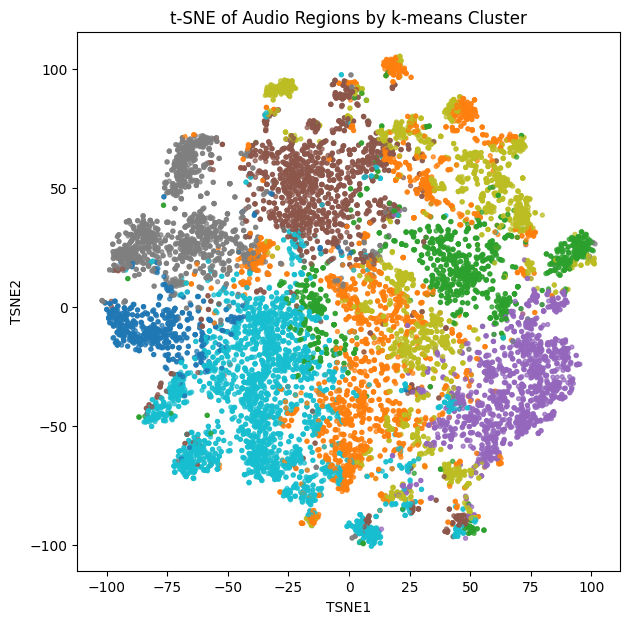

In [16]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, random_state=42, init='pca', learning_rate='auto')
X2 = tsne.fit_transform(X)

plt.figure(figsize=(7,7))
plt.scatter(X2[:,0], X2[:,1], c=clusters, s=8, cmap='tab10', alpha=0.7)
plt.title("t‑SNE of Audio Regions by k‑means Cluster")
plt.xlabel("TSNE1")
plt.ylabel("TSNE2")
plt.show()


## 8. Optimize Number of Clusters (Silhouette vs k)

Before settling on **k=8**, let’s systematically evaluate silhouette score over a range of k values:

- Compute silhouette for k from 2 up to, say, 12.  
- Plot the curve and look for a local peak or “elbow.”  
- Choose the k that maximizes cluster separation while keeping interpretability.


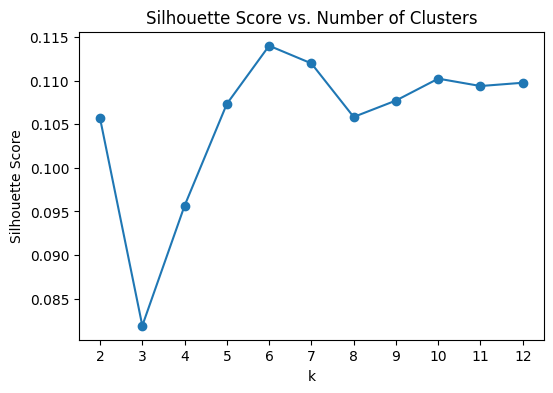

In [18]:
# ─── Cell 8: Silhouette vs k ───────────────────────────────────────
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

sil_scores = []
ks = list(range(2, 13))
for k in ks:
    km = KMeans(n_clusters=k, random_state=42).fit(X)
    sil_scores.append(silhouette_score(X, km.labels_))

plt.figure(figsize=(6,4))
plt.plot(ks, sil_scores, marker='o')
plt.title('Silhouette Score vs. Number of Clusters')
plt.xlabel('k')
plt.ylabel('Silhouette Score')
plt.xticks(ks)
plt.show()


## 9. Inspect Cluster Centroids

Let’s look at the **mean feature vector** for each cluster to see how they differ:

- Plot the centroid of each cluster (e.g. first 20 dims or PCA loadings).  
- Identify which clusters correspond to “silence” vs. distinct sound patterns.  


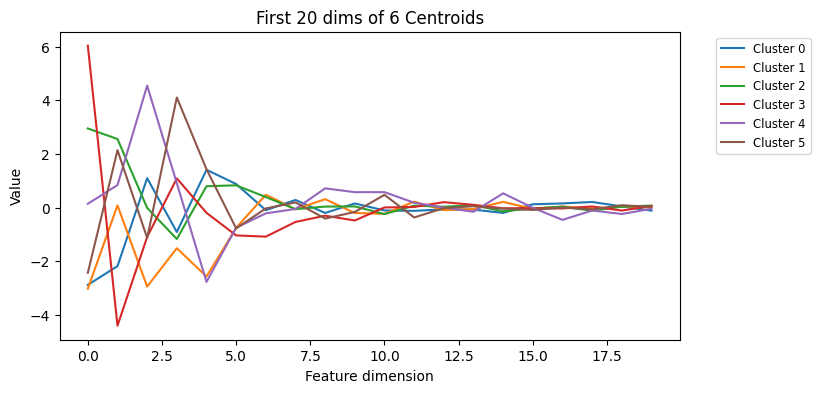

In [20]:
# ─── Cell 9: Cluster Centroids ─────────────────────────────────────
import numpy as np


k_opt = ks[sil_scores.index(max(sil_scores))]
km_opt = KMeans(n_clusters=k_opt, random_state=42).fit(X)
centroids = km_opt.cluster_centers_


plt.figure(figsize=(8,4))
for i, cent in enumerate(centroids):
    plt.plot(cent[:20], label=f'Cluster {i}')
plt.legend(bbox_to_anchor=(1.05,1), loc='upper left', fontsize='small')
plt.title(f'First 20 dims of {k_opt} Centroids')
plt.xlabel('Feature dimension')
plt.ylabel('Value')
plt.show()


## 10. Listen to Example Segments per Cluster

To confirm cluster semantics, we’ll sample a few regions from each cluster and play back the raw audio:

1. **Record meta** in your extraction step (file_id, onset, offset) so we can map region → original `.wav`.  
2. Load the corresponding `.wav` slices and use `IPython.display.Audio`.  
3. For each cluster, listen to 2–3 random examples and note if they share a sound type.


In [27]:
# ─── Cell 10: Playback Examples (fixed) ────────────────────────────
import librosa
from IPython.display import Audio




def play_region(idx):
    
    file_id, onset, offset = region_meta[idx]  
    audio_path = os.path.join('C:\\Users\\mueid\\development\\AI\\MLPC2025S_Data_Exploration\\MLPC2025_dataset\\audio', file_id)  # includes .mp3

    
    y, sr = librosa.load(audio_path, sr=None)

    
    start_sample = int(onset  * sr)
    end_sample   = int(offset * sr)

    
    segment = y[start_sample:end_sample]
    return Audio(segment, rate=sr)


for cl in range(k_opt):
    print(f"\nCluster {cl} examples:")
    idxs = [i for i,c in enumerate(km_opt.labels_) if c==cl]
    for i in random.sample(idxs, min(2, len(idxs))):
        display(play_region(i))



Cluster 0 examples:



Cluster 1 examples:



Cluster 2 examples:



Cluster 3 examples:



Cluster 4 examples:



Cluster 5 examples:


In [ ]:
import pandas as pd
pd.DataFrame({
    'region_idx':  np.arange(len(clusters)),
    'cluster':     clusters,
    'is_silence':  region_labels=='silence'
}).to_csv(BASE_DIR+'\\audio_region_clusters.csv', index=False)
